## Imports

In [1]:
# from astroquery.gaia import Gaia
from astropy.io.votable import parse
from astropy import units as u
from astropy.coordinates import SkyCoord
from sklearn.neighbors import NearestNeighbors
import scipy as sp
from scipy.spatial import distance
from scipy import stats
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from functions import * 
# import mpl_scatter_density
from matplotlib.colors import LinearSegmentedColormap
from scipy.optimize import curve_fit
from sklearn.mixture import GaussianMixture
from sklearn.cluster import DBSCAN
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import normalize, StandardScaler
import scienceplots
import networkx as nx
from astropy.io.votable import parse_single_table
# import mplcursors


import warnings
warnings.filterwarnings('ignore')

----

## Data

In [2]:
import os

path = "../MST PAPER DATA/IC_4756"

# Check if the directory exists, if not, create it
if not os.path.exists(path):
    os.makedirs(path)
    print(f"Directory {path} created")
else:
    print(f"Directory {path} already exists")

Directory ../MST PAPER DATA/IC_4756 already exists


In [3]:
Clusters = pd.read_excel("../Clusters.xlsx", index_col=0)

In [4]:
new_cluster = {"Name": "IC_4756", 
               "init_data": 0,
               "init_filter": 0,
               "mst_cut": 0,
               "mst_filter": 0,
               "gmm_filter": 0,
               "pmra":0, "pmdec":0, "ra":0, "dec":0, "plx":0, "prob_80":0,
               "ra_error":0, "dec_error":0, "pmra_error":0, "pmdec_error":0, "plx_error":0
              }

In [5]:
df_IC_4756  = pd.read_parquet("./IC_4756/IC_4756_(5deg)-result.parquet")

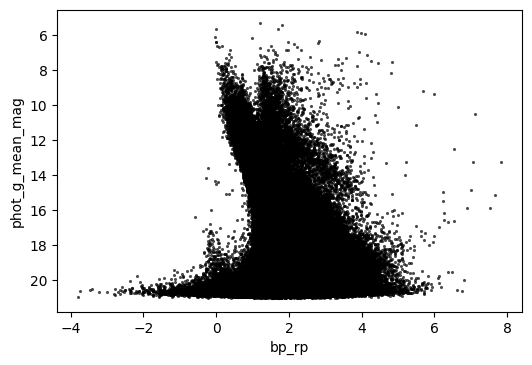

In [6]:
cmd_plot(data=df_IC_4756, x_axis='bp_rp', y_axis='phot_g_mean_mag', s=5, alpha=.7)

In [7]:
df_IC_4756.columns

Index(['DESIGNATION', 'SOURCE_ID', 'ra', 'ra_error', 'dec', 'dec_error',
       'parallax', 'parallax_error', 'pm', 'pmra', 'pmra_error', 'pmdec',
       'pmdec_error', 'ruwe', 'phot_g_mean_flux_error', 'phot_g_mean_mag',
       'phot_bp_mean_flux_error', 'phot_bp_mean_mag',
       'phot_rp_mean_flux_error', 'phot_rp_mean_mag', 'bp_rp', 'bp_g', 'g_rp',
       'radial_velocity', 'phot_variable_flag', 'l', 'b', 'non_single_star',
       'has_xp_continuous', 'has_xp_sampled', 'has_rvs',
       'has_epoch_photometry', 'has_epoch_rv', 'has_mcmc_gspphot',
       'has_mcmc_msc', 'teff_gspphot', 'logg_gspphot', 'mh_gspphot',
       'distance_gspphot', 'azero_gspphot', 'ag_gspphot', 'ebpminrp_gspphot'],
      dtype='object')

In [8]:
len(df_IC_4756)

1991520

In [9]:
new_cluster["init_data"] = len(df_IC_4756)

----

# MST Method


## 1. Initial Filters on Data

In [10]:
df_IC_4756_init = df_IC_4756.drop(['ra_error', 'dec_error',
       'pmra_error', 
       'pmdec_error', 'ruwe', 'phot_g_mean_flux_error', 
       'phot_bp_mean_flux_error', 'phot_bp_mean_mag',
       'phot_rp_mean_flux_error', 'phot_rp_mean_mag',
       'radial_velocity', 'phot_variable_flag', 'non_single_star',
       'has_xp_continuous', 'has_xp_sampled', 'has_rvs',
       'has_epoch_photometry', 'has_epoch_rv', 'has_mcmc_gspphot',
       'has_mcmc_msc', 'teff_gspphot', 'logg_gspphot', 'mh_gspphot',
       'distance_gspphot', 'azero_gspphot', 'ag_gspphot', 'ebpminrp_gspphot'], axis=1).dropna(axis=0)

df_IC_4756_init = df_IC_4756_init[df_IC_4756_init['parallax_error'] < 0.2]

In [11]:
len(df_IC_4756_init)

258427

In [12]:
# Initial Filter on PMRA and PMDEC 

def filter_proper_motion(data, pmra, pmdec, d_pmra=2, d_pmdec=2):
    # d_pmra = 3 * d_pmra
    # d_pmdec = 3 * d_pmdec
    return data[(abs(data['pmra'] - pmra) < abs(d_pmra * pmra)) & (abs(data['pmdec'] - pmdec) < abs(d_pmdec * pmdec))]

def filter_parallax(data, parallax, delta = .2):
    return data[(abs(data['parallax'] -  parallax) < abs(delta * parallax))]

# def filter_distance(data, r_med, delta = 100):
#     return data[(abs(data['r_med_geo'] - r_med) < delta)] # r_med_geo

In [13]:
df_IC_4756_init = filter_proper_motion(df_IC_4756_init, 1.28434803, -4.96816324, .3, .3)
df_IC_4756_init = filter_parallax(df_IC_4756_init, 2.10751340, 0.3)

In [14]:
len(df_IC_4756_init)

962

In [15]:
new_cluster["init_filter"] = len(df_IC_4756_init)

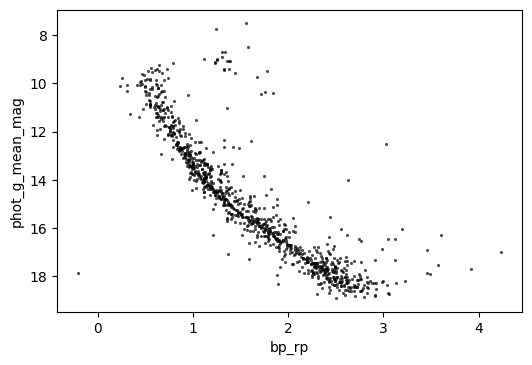

In [16]:
cmd_plot(data = df_IC_4756_init, x_axis = 'bp_rp', y_axis = 'phot_g_mean_mag', s = 5, alpha = .7)

-----

## 2. MST

In [17]:
params = ['ra', 'dec', 'parallax']

In [18]:
scaler = StandardScaler()
x_scaled = scaler.fit_transform(df_IC_4756_init[params])

df_scaled = pd.DataFrame(data=x_scaled, columns=params)
df_scaled['SOURCE_ID'] = df_IC_4756_init['SOURCE_ID'].values

threshold: 0.85


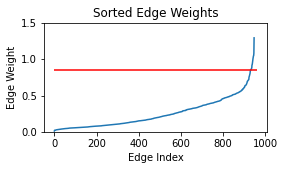

In [19]:
thresh, df_scaled = min_span_tree(df_scaled, params=params, num_std=3, manual_th=0, threshold=.8, y_limit=1.5, fig=True)

In [20]:
new_cluster["mst_cut"] = thresh

In [21]:
print(len(df_scaled[df_scaled['MST_cluster']==1]))
print(len(df_scaled[df_scaled['MST_cluster']==0]))

795
167


In [22]:
new_cluster["mst_filter"] = len(df_scaled[df_scaled['MST_cluster']==1])

In [23]:
df_IC_4756_mst = df_IC_4756_init.merge(df_scaled[["MST_cluster", "SOURCE_ID"]], on='SOURCE_ID', how='left')

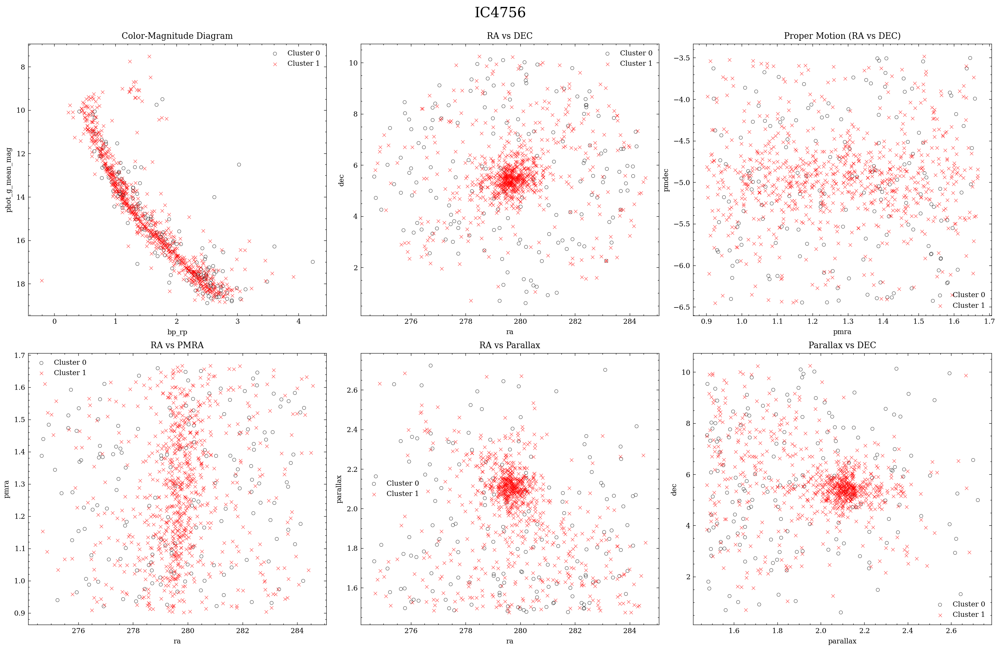

In [24]:
with plt.style.context(['science', 'ieee', 'no-latex']):
    fig, axes = plt.subplots(2, 3, figsize=(16, 10), dpi=200)

    # First row
    cmd_plotly(df_IC_4756_mst, 'bp_rp', 'phot_g_mean_mag', huex='MST_cluster', 
               s=15, alpha=.99, ax=axes[0, 0], theme={1: 'red', 0: 'black'})
    axes[0, 0].set_title('Color-Magnitude Diagram')

    cmd_plotly(df_IC_4756_mst, 'ra', 'dec', huex='MST_cluster', 
               s=15, alpha=.99, ax=axes[0, 1], theme={1: 'red', 0: 'black'})
    axes[0, 1].invert_yaxis()
    axes[0, 1].set_title('RA vs DEC')

    cmd_plotly(df_IC_4756_mst, 'pmra', 'pmdec', huex='MST_cluster', 
               s=15, alpha=.99, ax=axes[0, 2], theme={1: 'red', 0: 'black'})
    axes[0, 2].invert_yaxis()
    axes[0, 2].set_title('Proper Motion (RA vs DEC)')

    # Second row
    cmd_plotly(df_IC_4756_mst, 'ra', 'pmra', huex='MST_cluster', 
               s=15, alpha=.99, ax=axes[1, 0], theme={1: 'red', 0: 'black'})
    axes[1, 0].invert_yaxis()
    axes[1, 0].set_title('RA vs PMRA')

    cmd_plotly(df_IC_4756_mst, 'ra', 'parallax', huex='MST_cluster', 
               s=15, alpha=.99, ax=axes[1, 1], theme={1: 'red', 0: 'black'})
    axes[1, 1].invert_yaxis()
    axes[1, 1].set_title('RA vs Parallax')

    cmd_plotly(df_IC_4756_mst, 'parallax', 'dec', huex='MST_cluster', 
               s=15, alpha=.99, ax=axes[1, 2], theme={1: 'red', 0: 'black'})
    axes[1, 2].invert_yaxis()
    axes[1, 2].set_title('Parallax vs DEC')

    plt.tight_layout()  
    plt.suptitle("IC4756", fontsize=16, y=1.03)  
    plt.savefig(path + "/MST_filter.pdf")

#### Statistical Approach (Finding Outliers)

In [25]:
df_IC_4756_mst = df_IC_4756_mst[df_IC_4756_mst['MST_cluster']==1]
df_IC_4756_mst = df_IC_4756_mst.reset_index()

In [26]:
scaler = StandardScaler()
temp_df = pd.DataFrame()
to_drop = []

temp_df[['parallax', 'ra', 'dec', 'pmra', 'pmdec']] = scaler.fit_transform(
    df_IC_4756_mst[['parallax', 'ra', 'dec', 'pmra', 'pmdec']]
)

for i in ['parallax', 'ra', 'dec', 'pmra', 'pmdec']:
    outliers = temp_df[abs(temp_df[i]) > 3].index
    to_drop.extend(outliers)

df_IC_4756_mst = df_IC_4756_mst.drop(to_drop)

In [27]:
len(df_IC_4756_mst)

774

## 3. GMM

In [28]:
def gassian_mixture(data, parameters = ['pmra', 'pmdec', 'parallax', 'ra', 'dec']):
    np.random.seed(0)
    
    scaler = StandardScaler()
    x_scaled = scaler.fit_transform(data[parameters])
    
    gm = GaussianMixture(n_components=2, random_state=101)

    y_pred = gm.fit_predict(x_scaled)
    y_prob = gm.predict_proba(x_scaled)

    data['gmm_pred'] = y_pred
    data['gmm_prob'] = np.amax(y_prob,axis=1)
    return data, gm

In [29]:
# GMM on MST
df_IC_4756_cluster, model = gassian_mixture(df_IC_4756_mst)

In [30]:
df_IC_4756_cluster.gmm_pred.value_counts()

0    469
1    305
Name: gmm_pred, dtype: int64

In [31]:
df_IC_4756_cluster["cluster_pred_num"] = np.where(df_IC_4756_cluster['gmm_pred'] == 1, 0, 
                                                   np.where(df_IC_4756_cluster['gmm_pred'] == 0, 1, 
                                                            df_IC_4756_cluster['gmm_pred']))

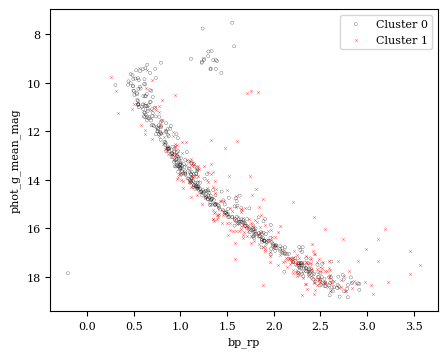

In [32]:
cmd_plotly(df_IC_4756_cluster, 
           'bp_rp', 'phot_g_mean_mag', huex='gmm_pred', s=5, alpha=0.99, theme={1:'red', 0:'black'})

In [33]:
num_cluster = 1

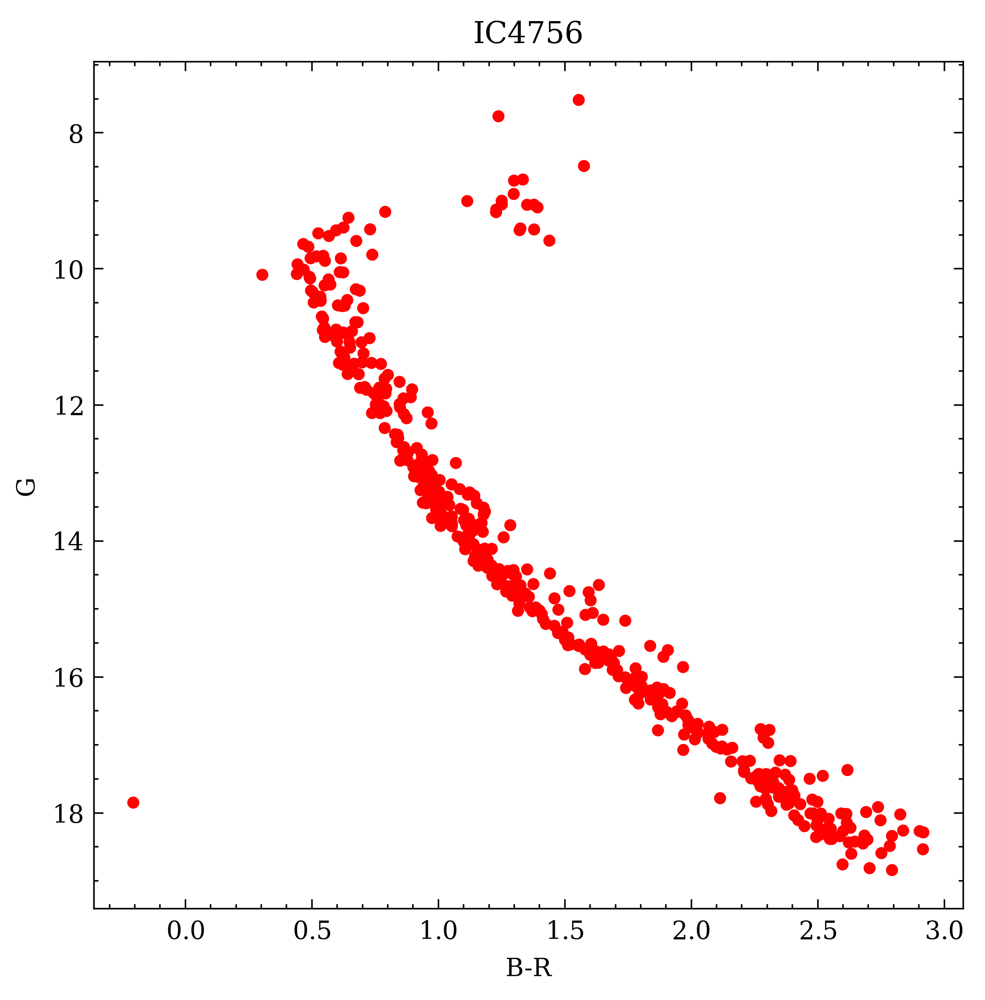

In [39]:
with plt.style.context(['science', 'ieee', 'no-latex']):
    plt.figure(figsize=(5,5), dpi=500)
    sns.scatterplot(data=df_IC_4756_cluster[df_IC_4756_cluster['cluster_pred_num']==num_cluster], 
           x='bp_rp', y='phot_g_mean_mag', s=15, alpha=.99, lw=0, edgecolor="none", color="red")
    plt.xlabel("B-R")
    plt.ylabel("G")
    plt.gca().invert_yaxis()
    plt.title("IC4756")
    plt.savefig(path + "/IC_4756_cmd_gmm.pdf")
    plt.savefig(path + "/IC_4756_cmd_gmm.jpg")

In [35]:
### cluster stars

len(df_IC_4756_cluster[(df_IC_4756_cluster['cluster_pred_num']==num_cluster)])

469

In [36]:
### high probable stars
len(df_IC_4756_cluster[(df_IC_4756_cluster['cluster_pred_num']==num_cluster) & (df_IC_4756_cluster['gmm_prob']>=0.8)])

435

In [37]:
new_cluster["gmm_filter"] = len(df_IC_4756_cluster[(df_IC_4756_cluster['cluster_pred_num']==num_cluster)])

In [38]:
new_cluster["prob_80"] = len(df_IC_4756_cluster[(df_IC_4756_cluster['cluster_pred_num']==num_cluster) &
                                                 (df_IC_4756_cluster['gmm_prob']>=0.8)])

## 4. Evaluation

### KDE Plots

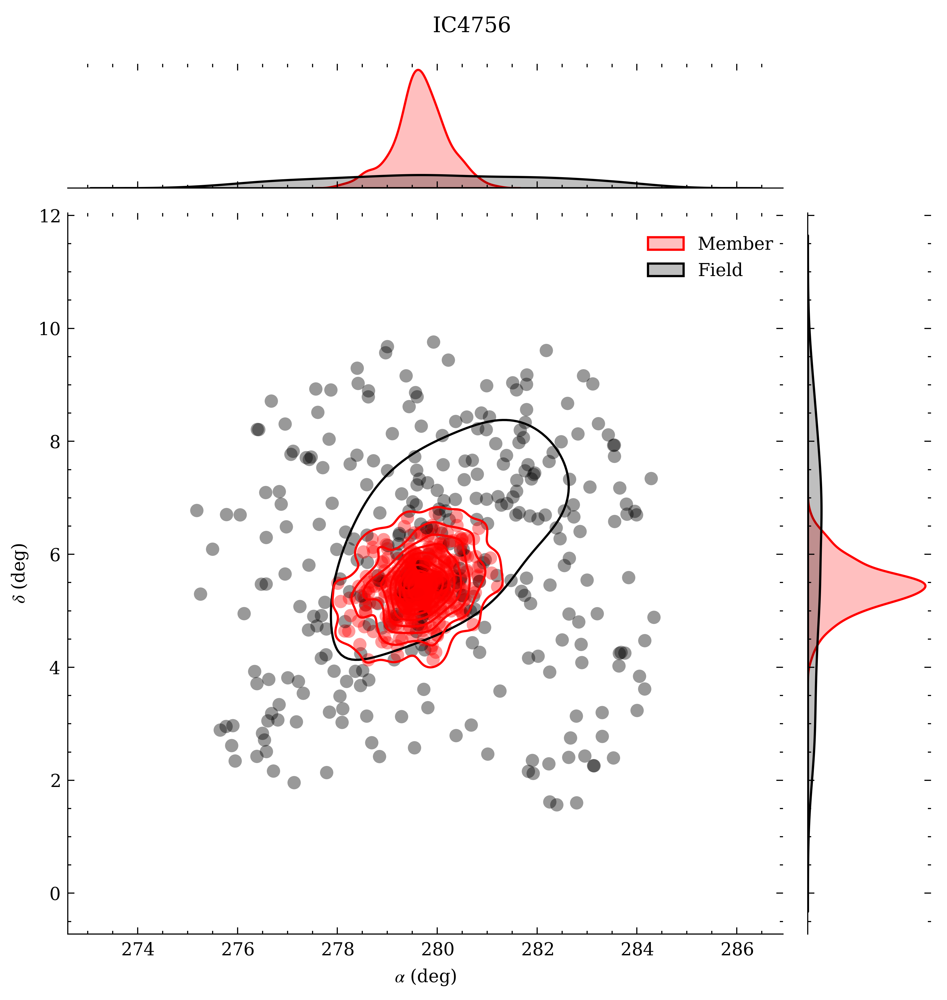

In [40]:
with plt.style.context(['science', 'ieee', 'no-latex']):
    g = sns.jointplot(data=df_IC_4756_cluster, x='ra', y='dec', kind='scatter', hue='cluster_pred_num',
                      alpha=.4, lw=0, edgecolor="none", legend=False)
    # Add a kde plot to the same figure
    sns.kdeplot(data=df_IC_4756_cluster, x='ra', y='dec', hue='cluster_pred_num', alpha=1, ax=g.ax_joint, legend=False)
    
    g.ax_joint.set_xlabel(r'$\alpha$ (deg)')
    g.ax_joint.set_ylabel(r'$\delta$ (deg)')
    plt.legend(labels=['Member', 'Field'], loc='upper right', bbox_to_anchor=(-0.15, 0.99))
    plt.suptitle("IC4756", y=1.03)  
    plt.savefig(path + "/IC_4756_kde_scatter.pdf")
    plt.savefig(path + "/IC_4756_kde_scatter.jpg")

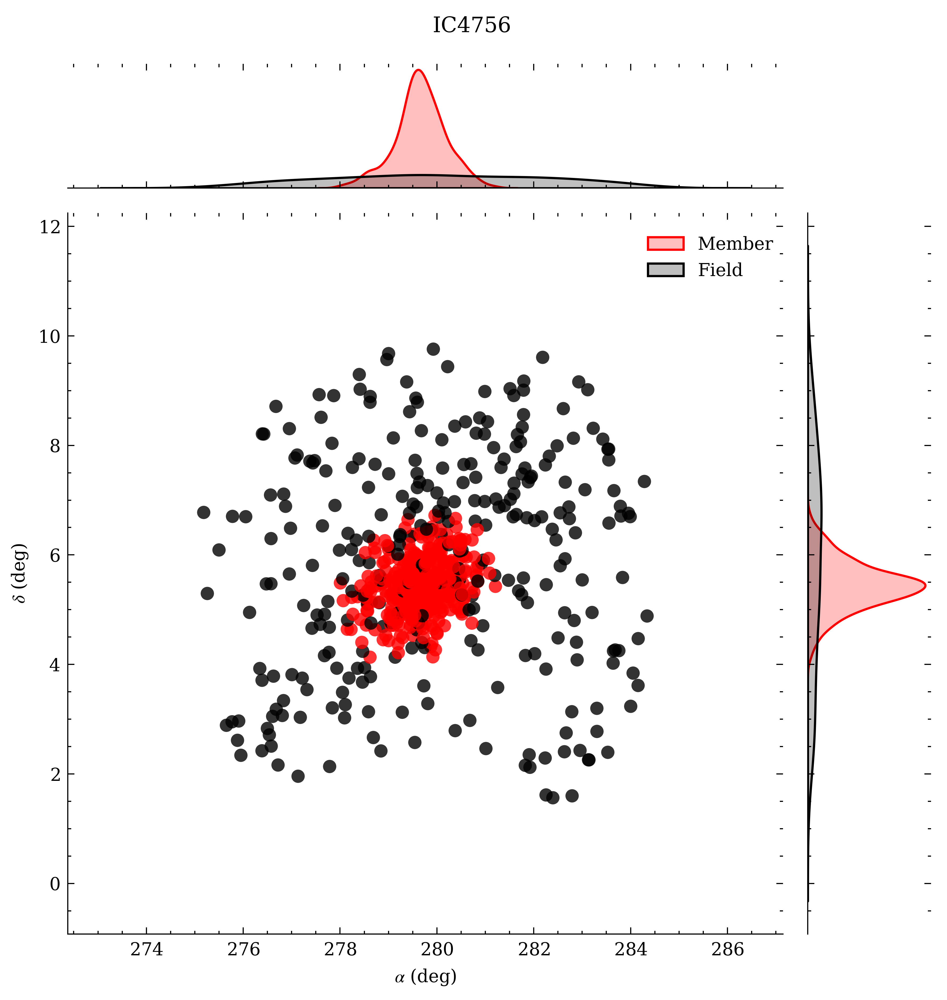

In [41]:
with plt.style.context(['science', 'ieee', 'no-latex']):
    g = sns.jointplot(data=df_IC_4756_cluster, x='ra', y='dec', kind='scatter', hue='cluster_pred_num',
                  alpha=.8, lw=0, edgecolor="none", legend=False)
    
    g.ax_joint.set_xlabel(r'$\alpha$ (deg)')
    g.ax_joint.set_ylabel(r'$\delta$ (deg)')
    plt.legend(labels=['Member', 'Field'], loc='upper right', bbox_to_anchor=(-0.15, 0.99))
    plt.suptitle("IC4756", y=1.03)
    plt.savefig(path + "/IC_4756_joint_scatter.pdf")
    plt.savefig(path + "/IC_4756_joint_scatter.jpg")

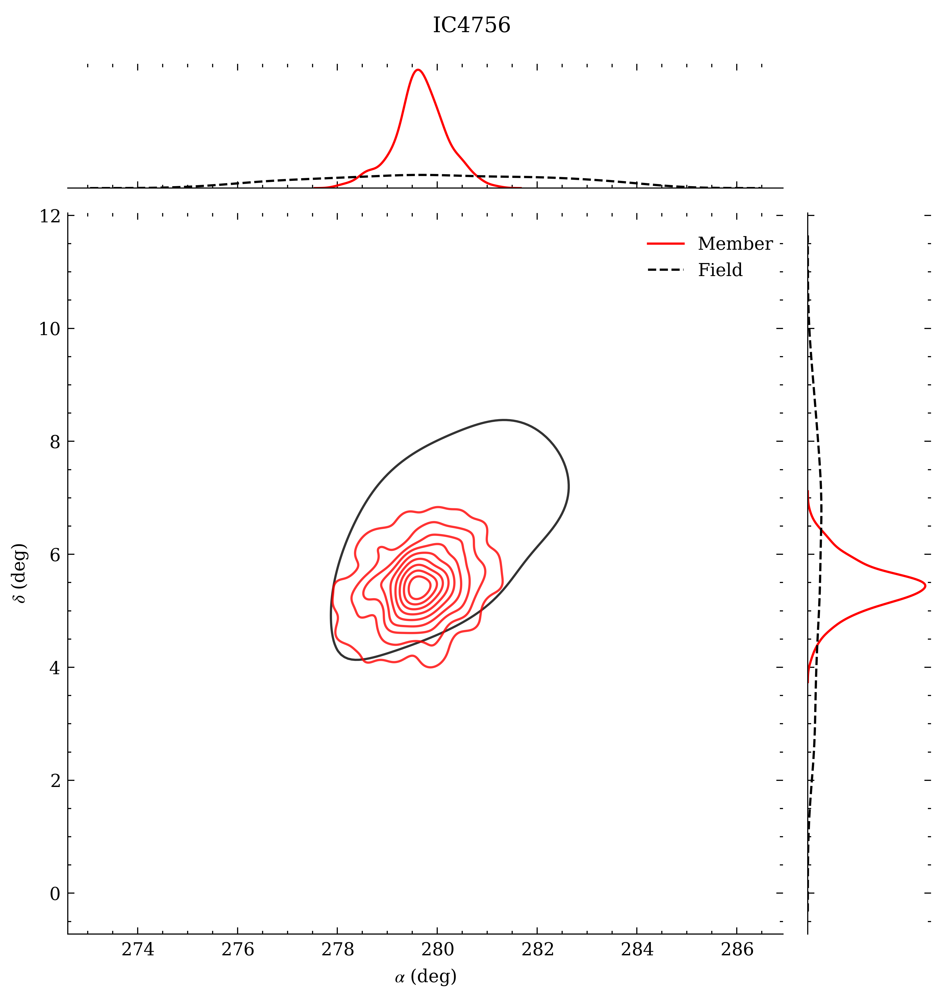

In [42]:
with plt.style.context(['science', 'ieee', 'no-latex']):
    g = sns.jointplot(data=df_IC_4756_cluster, x='ra', y='dec', kind='kde', hue='cluster_pred_num', 
                  alpha=.8, lw=0, edgecolor="none", legend=False)
    
    g.ax_joint.set_xlabel(r'$\alpha$ (deg)')
    g.ax_joint.set_ylabel(r'$\delta$ (deg)')
    plt.legend(labels=['Member', 'Field'], loc='upper right', bbox_to_anchor=(-0.15, 0.99))
    plt.suptitle("IC4756", y=1.03)
    plt.savefig(path + "/IC_4756_kde.pdf")
    plt.savefig(path + "/IC_4756_kde.jpg")

In [43]:
def black_body_plot(data, x_axis, y_axis, ax=None, alpha=0.8, s=8):
    
    with plt.style.context(['ieee']):
        if ax is None:
#             fig = plt.figure(figsize=(4,4), dpi=100)
            ax = fig.add_subplot(111)
        sns.scatterplot(data=data, y=y_axis, x=x_axis, alpha=alpha, s=s, ax=ax, color='black', lw=0, edgecolor="none")
        ax.invert_xaxis()

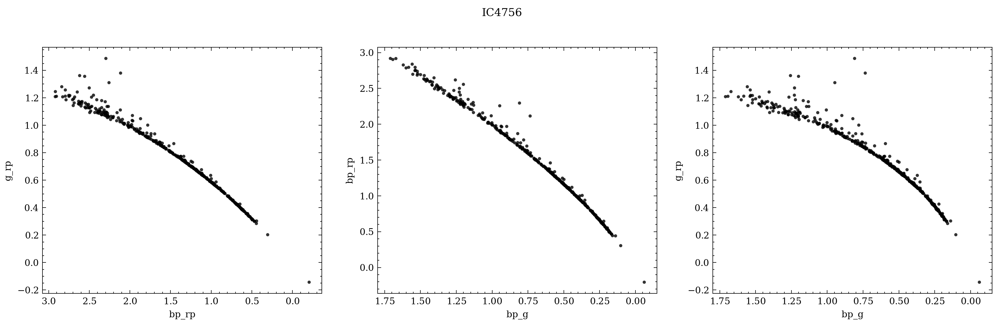

In [44]:
with plt.style.context(['science', 'ieee', 'no-latex']):
    fig, axes = plt.subplots(1, 3, figsize=(15, 4), dpi=300)
    black_body_plot(df_IC_4756_cluster[(df_IC_4756_cluster['cluster_pred_num']==num_cluster)], 'bp_rp', 'g_rp', ax=axes[0])
    # black_body_plot(stars, 'bp_rp', 'g_rp', ax=axes[0], s=50)

    black_body_plot(df_IC_4756_cluster[(df_IC_4756_cluster['cluster_pred_num']==num_cluster)], 'bp_g', 'bp_rp', ax=axes[1])
    # black_body_plot(stars, 'bp_rp', 'g_rp', ax=axes[1], s=50)

    black_body_plot(df_IC_4756_cluster[(df_IC_4756_cluster['cluster_pred_num']==num_cluster)], 'bp_g', 'g_rp', ax=axes[2])
    # black_body_plot(stars, 'bp_rp', 'g_rp', ax=axes[2], s=50)
    plt.suptitle("IC4756", y=1.)
    plt.savefig(path+"/IC_4756_bb.pdf")

### King Profile

In [45]:
cluster = df_IC_4756_cluster[(df_IC_4756_cluster['cluster_pred_num']==num_cluster)]

In [46]:
new_cluster["ra"], new_cluster["dec"], new_cluster["pmra"], new_cluster["pmdec"], new_cluster["plx"]  = \
np.mean(cluster['ra']), np.mean(cluster['dec']), np.mean(cluster['pmra']), np.mean(cluster['pmdec']), np.mean(cluster['parallax'])

In [47]:
new_cluster

{'Name': 'IC_4756',
 'init_data': 1991520,
 'init_filter': 962,
 'mst_cut': 0.85,
 'mst_filter': 795,
 'gmm_filter': 469,
 'pmra': 1.2784989404036278,
 'pmdec': -4.9732502865764605,
 'ra': 279.65927461056646,
 'dec': 5.43540222349283,
 'plx': 2.1158263518930704,
 'prob_80': 435,
 'ra_error': 0,
 'dec_error': 0,
 'pmra_error': 0,
 'pmdec_error': 0,
 'plx_error': 0}

In [48]:
galactic_coord = SkyCoord(l=101.12151 * u.deg, b=-21.156262 * u.deg, frame='galactic')

icrs_coord = galactic_coord.transform_to('icrs')

print("RA (ICRS J2000):", icrs_coord.ra.to_string(u.hour))
print("Dec (ICRS J2000):", icrs_coord.dec.to_string(u.degree))

RA (ICRS J2000): 23h08m08.70041581s
Dec (ICRS J2000): 37d18m07.97110594s


In [49]:
np.mean(cluster['ra']), np.mean(cluster['dec'])

(279.65927461056646, 5.43540222349283)

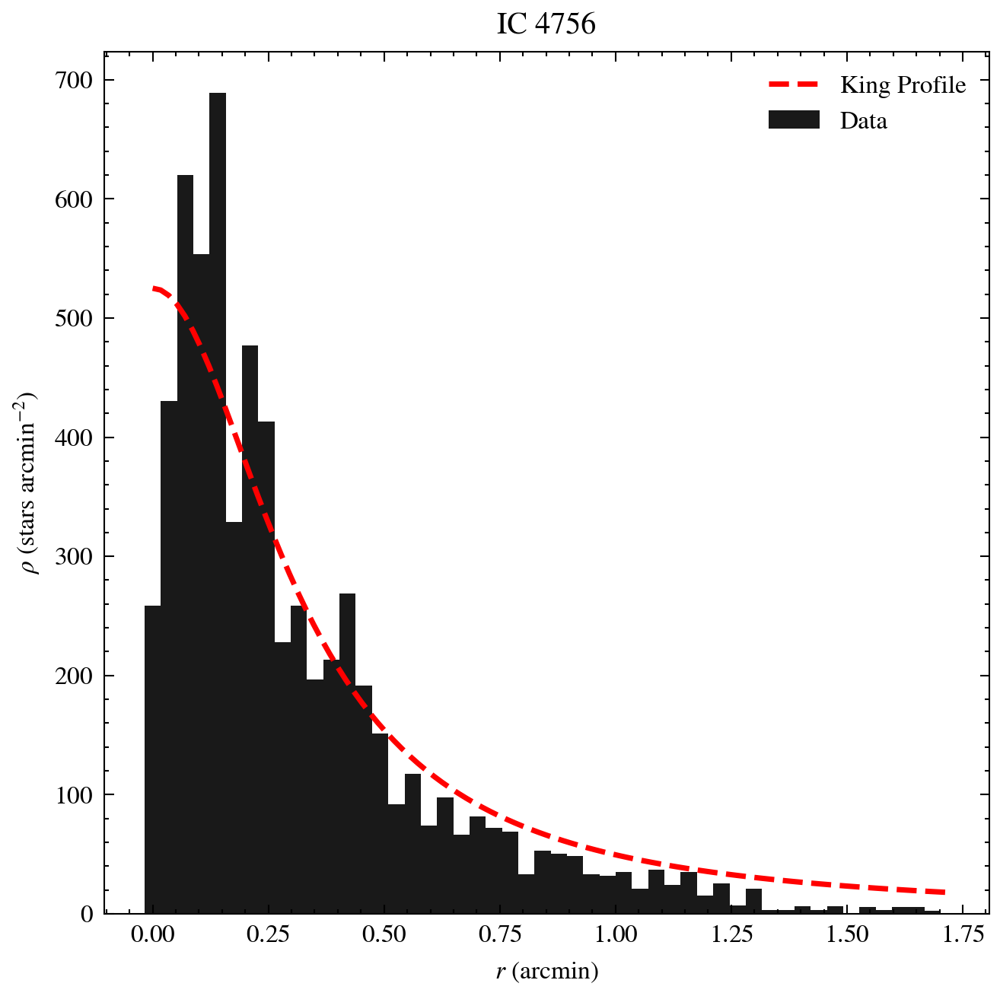

IC_4756
f_b: 0.0 std: 18.53
f_0: 525.03
R_c: 0.32
R_t: 0.94


In [51]:
# Fit the King profile
coefs, R_t, cov = fit_king_profile(cluster, path=path, radius_num=50, cluster_name="IC 4756")

# Print results
print('IC_4756')
print("f_b:", round(coefs[0], 2), 'std:', round(np.sqrt(cov[0, 0]), 2))  # Background density and its error
print("f_0:", round(coefs[1], 2))  # Central density above the background
print("R_c:", round(coefs[2], 2))  # Core radius
print("R_t:", round(R_t, 2))  # Tidal radius

In [52]:
# Core radius error
err_Rc = np.sqrt(cov[2, 2])  # Standard deviation of R_c
print("Err Rc:", round(err_Rc, 5))

# Tidal radius error calculation
err_Rt = (coefs[2] + err_Rc) * np.sqrt(coefs[1] / (3 * np.sqrt(cov[0, 0])) - 1)
print("Err Rt:", round(err_Rt, 5))

Err Rc: 0.04263
Err Rt: 1.06066


In [53]:
# Center of the cluster
center = (np.mean(cluster['ra']), np.mean(cluster['dec']))
distances = np.sqrt((cluster['ra'] - center[0])**2 + (cluster['dec'] - center[1])**2)

# Stars within core radius
stars_within_core = cluster[(distances < coefs[2])]
print(f"Stars within core radius: {len(stars_within_core)}")

# Stars outside tidal radius
stars_out_of_bound = cluster[(distances > R_t)]
print(f"Stars outside tidal radius: {len(stars_out_of_bound)}")

Stars within core radius: 139
Stars outside tidal radius: 88


In [61]:
# df_IC_4756_cluster = df_IC_4756_cluster.merge(
#     df_IC_4756[["SOURCE_ID", "r_med_geo"]], on='source_id', how='left').drop("index", axis=1)

### Final Plotting

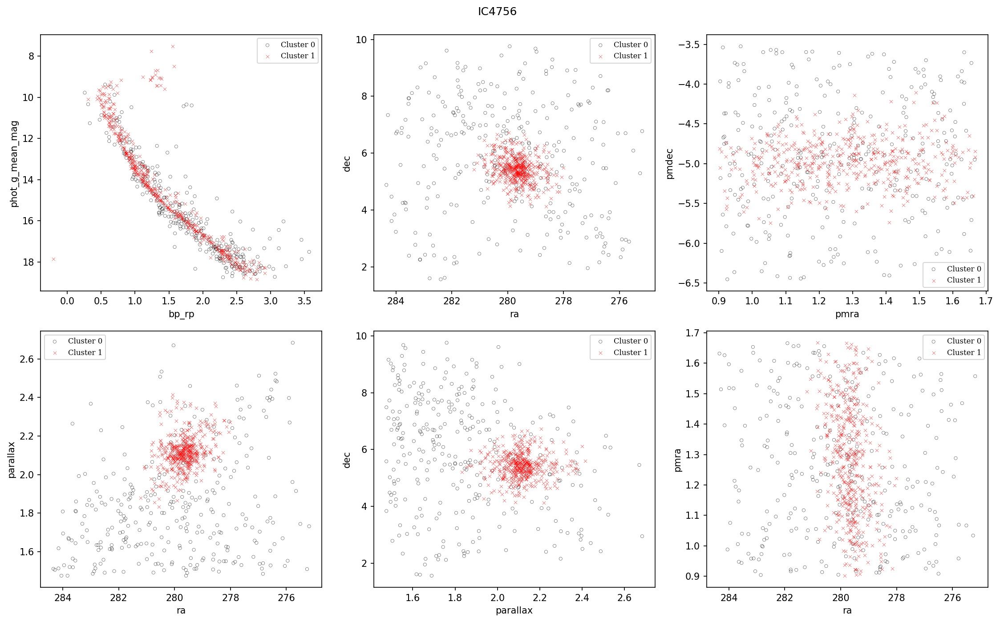

In [54]:
### PLOT THE CLUSTERS

fig, axes = plt.subplots(2, 3, figsize=(15, 9), dpi=150)

cmd_plotly(df_IC_4756_cluster, 'bp_rp', 'phot_g_mean_mag', huex='cluster_pred_num', s=12, alpha=.8, ax=axes[0,0], theme={1:'red', 0:'black'})
cmd_plotly(df_IC_4756_cluster, 'ra', 'dec', huex='cluster_pred_num', s=12, alpha=.8, ax=axes[0,1], theme={1:'red', 0:'black'})
axes[0,1].invert_yaxis()
axes[0,1].invert_xaxis()
cmd_plotly(df_IC_4756_cluster, 'ra', 'parallax', huex='cluster_pred_num', s=12, alpha=.8, ax=axes[1,0], theme={1:'red', 0:'black'})
axes[1,0].invert_yaxis()
axes[1,0].invert_xaxis()
cmd_plotly(df_IC_4756_cluster, 'parallax', 'dec', huex='cluster_pred_num', s=12, alpha=.8, ax=axes[1,1], theme={1:'red', 0:'black'})
axes[1,1].invert_yaxis()
cmd_plotly(df_IC_4756_cluster, 'pmra', 'pmdec', huex='cluster_pred_num', s=12, alpha=.8, ax=axes[0,2], theme={1:'red', 0:'black'})
axes[0,2].invert_yaxis()
cmd_plotly(df_IC_4756_cluster, 'ra', 'pmra', huex='cluster_pred_num', s=12, alpha=.8, ax=axes[1,2], theme={1:'red', 0:'black'})
axes[1,2].invert_xaxis()
axes[1,2].invert_yaxis()
plt.tight_layout()
plt.suptitle("IC4756", y=1.03)
plt.show()

In [55]:
len(cluster[cluster["gmm_prob"]>=0.8])

435

In [56]:
len(cluster[cluster["gmm_prob"]>=0.6])

457

In [57]:
len(cluster)

469

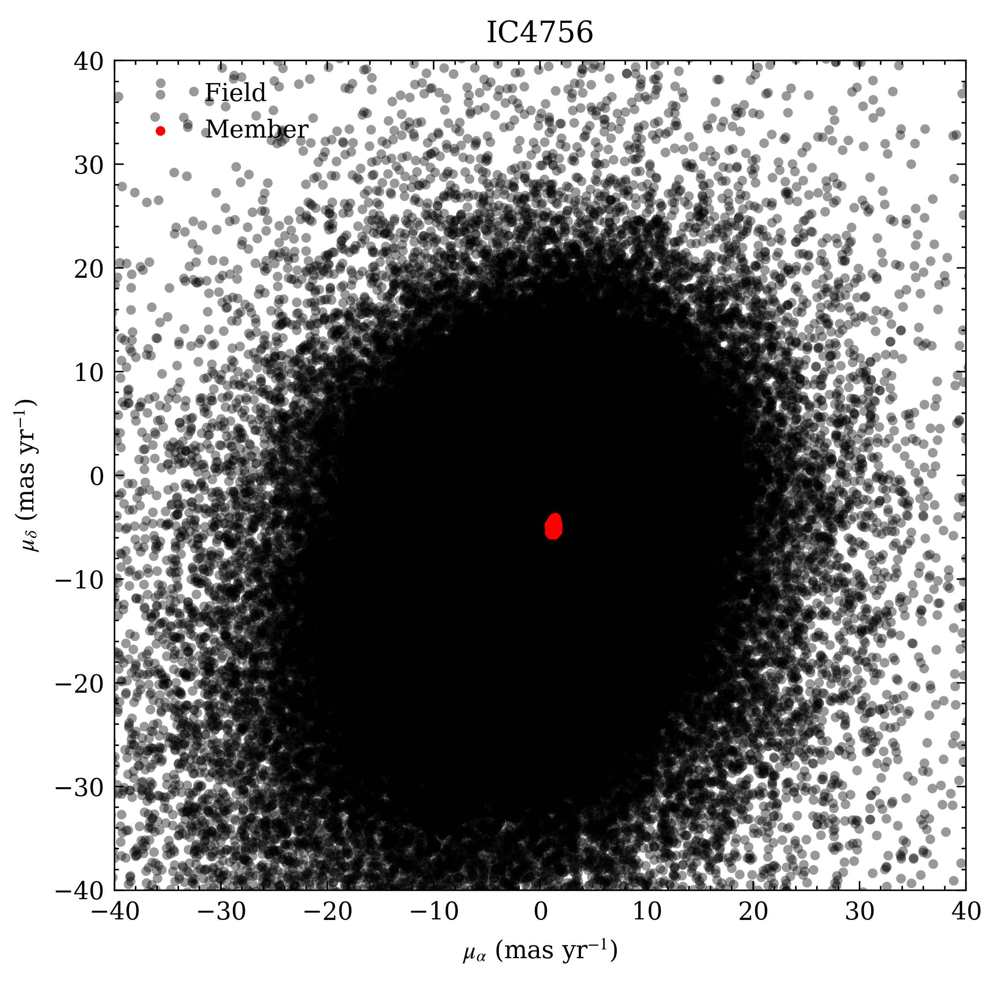

In [58]:
with plt.style.context(['science', 'ieee', 'no-latex']):
    plt.figure(figsize=(5, 5), dpi=500)
    sns.scatterplot(data=df_IC_4756, 
                    x='pmra', y='pmdec', s=10, alpha=.4, color="black", label="Field", lw=0, edgecolor="none")
    sns.scatterplot(data=df_IC_4756_cluster[df_IC_4756_cluster['cluster_pred_num'] == num_cluster],
                    x='pmra', y='pmdec', s=10, alpha=1, color='red', label="Member", lw=0, edgecolor="none")
    
    plt.xlabel(r'$\mu_\alpha$ (mas yr$^{-1}$)')
    plt.ylabel(r'$\mu_\delta$ (mas yr$^{-1}$)')
    plt.xlim(-40, 40)
    plt.ylim(-40, 40)
    plt.legend()
    plt.title("IC4756")
    plt.savefig(path+"/IC_4756_field_motion.jpg")

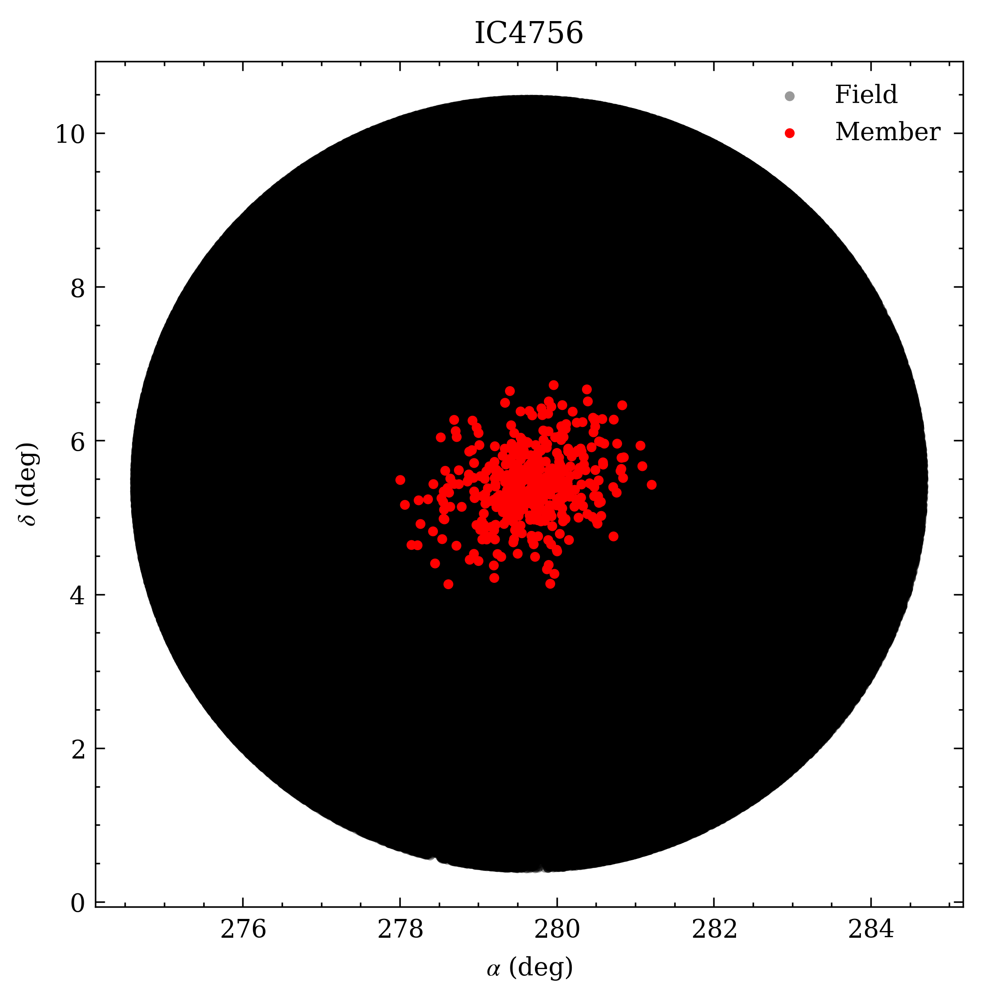

In [59]:
with plt.style.context(['science', 'ieee', 'no-latex']):
    plt.figure(figsize=(5, 5), dpi=500)
    sns.scatterplot(data=df_IC_4756, 
                    x='ra', y='dec', s=10, alpha=.4, color="black", label="Field", lw=0, edgecolor="none")
    sns.scatterplot(data=df_IC_4756_cluster[df_IC_4756_cluster['cluster_pred_num'] == num_cluster],
                    x='ra', y='dec', s=10, alpha=1, color='red', label="Member", lw=0, edgecolor="none")
    
    plt.ylabel(r'$\delta$ (deg)')
    plt.xlabel(r'$\alpha$ (deg)')
    plt.legend()
    plt.title("IC4756")
    plt.savefig(path+"/IC_4756_field_position.jpg")

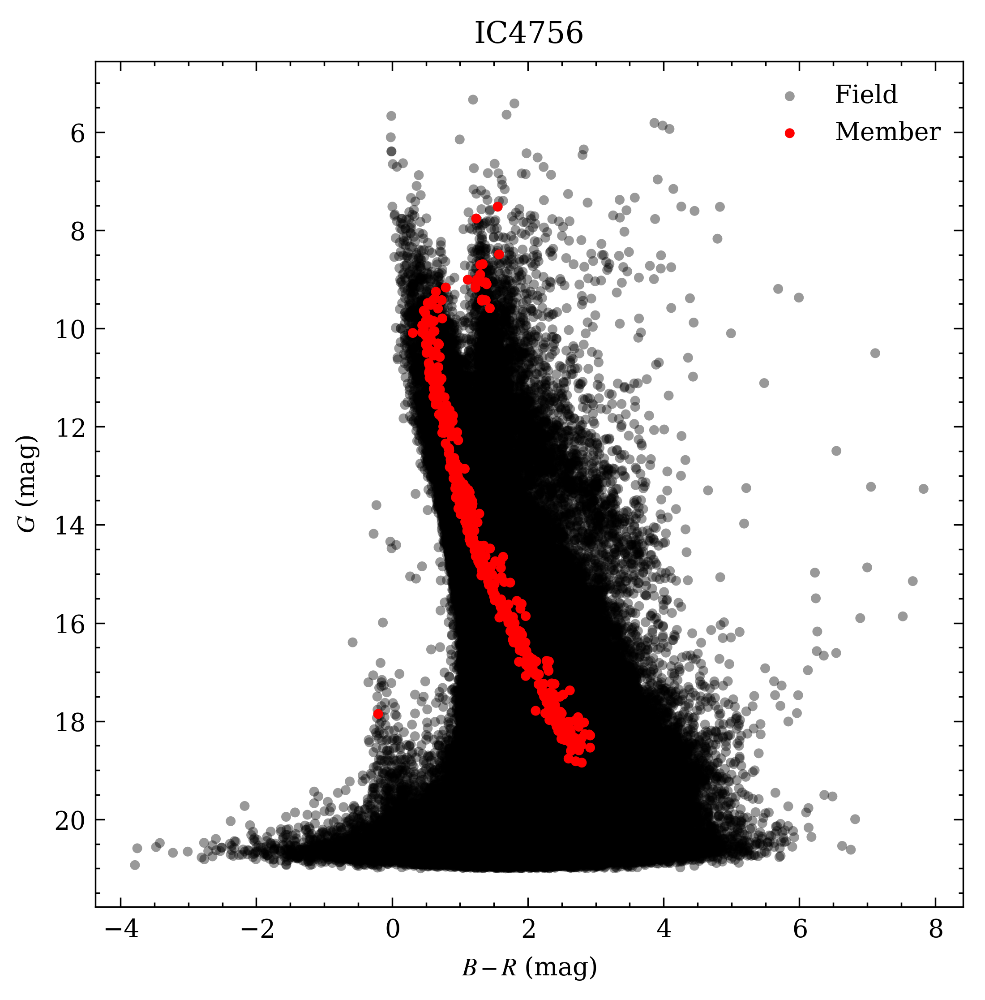

In [60]:
with plt.style.context(['science', 'ieee', 'no-latex']):
    plt.figure(figsize=(5, 5), dpi=500)
    sns.scatterplot(data=df_IC_4756, x='bp_rp', y='phot_g_mean_mag', s=10, alpha=.4, 
                    color="black", label="Field", lw=0, edgecolor="none")
    sns.scatterplot(data=df_IC_4756_cluster[df_IC_4756_cluster['cluster_pred_num'] == num_cluster],
                    x='bp_rp', y='phot_g_mean_mag', s=10, alpha=1, color='red', label="Member", lw=0, edgecolor="none")
    plt.gca().invert_yaxis()
    plt.legend()
    plt.ylabel(r'$G$ (mag)')
    plt.xlabel(r'$B-R$ (mag)')
    plt.title("IC4756")
    plt.savefig(path+"/IC_4756_field_CMD.jpg")

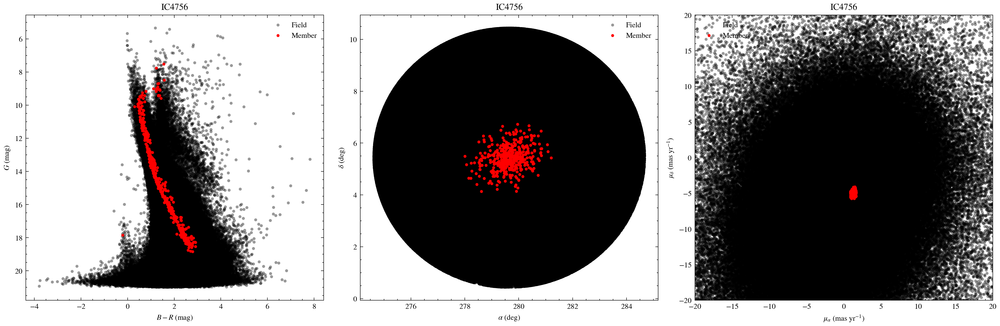

In [61]:
with plt.style.context(['science', 'ieee', 'no-latex']):

    # Create a figure with 1 row and 3 columns
    fig, axes = plt.subplots(1, 3, figsize=(15, 5), dpi=300)

    # First subplot: bp_rp vs phot_g_mean_mag
    sns.scatterplot(data=df_IC_4756, x='bp_rp', y='phot_g_mean_mag', s=10, alpha=.4, 
                    color="black", label="Field", ax=axes[0], lw=0, edgecolor="none")
    sns.scatterplot(data=df_IC_4756_cluster[df_IC_4756_cluster['cluster_pred_num'] == num_cluster],
                    x='bp_rp', y='phot_g_mean_mag', s=10, alpha=.99, color='red', label="Member", ax=axes[0], lw=0, edgecolor="none")
    axes[0].invert_yaxis()
    axes[0].legend()
    axes[0].set_ylabel(r'$G$ (mag)')
    axes[0].set_xlabel(r'$B-R$ (mag)')
    axes[0].set_title("IC4756")

    # Second subplot: ra vs dec
    sns.scatterplot(data=df_IC_4756, x='ra', y='dec', s=10, alpha=.4, color="black", label="Field", ax=axes[1], lw=0, edgecolor="none")
    sns.scatterplot(data=df_IC_4756_cluster[df_IC_4756_cluster['cluster_pred_num'] == num_cluster],
                    x='ra', y='dec', s=10, alpha=.99, color='red', label="Member", ax=axes[1], lw=0, edgecolor="none")
    axes[1].legend()
    axes[1].set_ylabel(r'$\delta$ (deg)')
    axes[1].set_xlabel(r'$\alpha$ (deg)')
    axes[1].set_title("IC4756")

    # Third subplot: pmra vs pmdec
    sns.scatterplot(data=df_IC_4756, 
                    x='pmra', y='pmdec', s=10, alpha=.4, color="black", label="Field", ax=axes[2], lw=0, edgecolor="none")
    sns.scatterplot(data=df_IC_4756_cluster[df_IC_4756_cluster['cluster_pred_num'] == num_cluster],
                    x='pmra', y='pmdec', s=10, alpha=.99, color='red', label="Member", ax=axes[2], lw=0, edgecolor="none")
    axes[2].set_xlim(-20, 20)
    axes[2].set_ylim(-20, 20)
    axes[2].legend()
    axes[2].set_ylabel(r'$\mu_\delta$ (mas yr$^{-1}$)')
    axes[2].set_xlabel(r'$\mu_\alpha$ (mas yr$^{-1}$)')
    axes[2].set_title("IC4756")

    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.savefig(path+"/IC_4756_field.pdf")
    plt.savefig(path+"/IC_4756_field.jpg")
    plt.show()

---

### Savings

In [62]:
df_IC_4756_cluster = df_IC_4756_cluster.merge(
    df_IC_4756[["SOURCE_ID", "ra_error",
             "dec_error", "pmra_error",
             "pmdec_error", "teff_gspphot"]], on='SOURCE_ID', how='left')

In [63]:
new_cluster["ra_error"], new_cluster["dec_error"], new_cluster["pmra_error"], new_cluster["pmdec_error"], new_cluster["plx_error"] = \
np.mean(df_IC_4756_cluster["ra_error"]), np.mean(df_IC_4756_cluster["dec_error"]), np.mean(df_IC_4756_cluster["pmra_error"]), np.mean(df_IC_4756_cluster["pmdec_error"]), np.mean(df_IC_4756_cluster["parallax_error"])

In [64]:
# Check if "IC_4756" exists in the "Name" column
if "IC_4756" in Clusters["Name"].values:
    Clusters.loc[Clusters["Name"] == "IC_4756", ['init_data', 'init_filter', 'mst_cut', 'mst_filter', 'gmm_filter',
        'pmra', 'pmdec', 'ra', 'dec', 'plx', 'prob_80', 'ra_error',
        'dec_error', 'pmra_error', 'pmdec_error', 'plx_error']] = list(new_cluster.values())[1:]
else:
    # Appending a new row using concat instead of append (append is deprecated)
    Clusters = pd.concat([Clusters, pd.DataFrame([new_cluster])], ignore_index=True)

In [65]:
Clusters.to_excel("../Clusters.xlsx")

In [66]:
df_IC_4756_cluster.to_excel("../MST PAPER DATA/IC_4756/IC_4756_members.xlsx")

### Comparison

In [67]:
## plots for comparision
tabel = parse_single_table(r"IC_4756\IC_4756_CG.vot")
df_IC_4756_CG = tabel.to_table().to_pandas()
tabel2 = parse_single_table(r"IC_4756\IC_4756_Hunt.vot")
df_IC_4756_Hunt = tabel2.to_table().to_pandas()

In [68]:
len(df_IC_4756_Hunt)

718

In [69]:
df_hunt_50 = df_IC_4756_Hunt[df_IC_4756_Hunt["Prob"]>0.5]
len(df_hunt_50)

397

CG members = 545
     Hunt members = 397
     MST members = 469


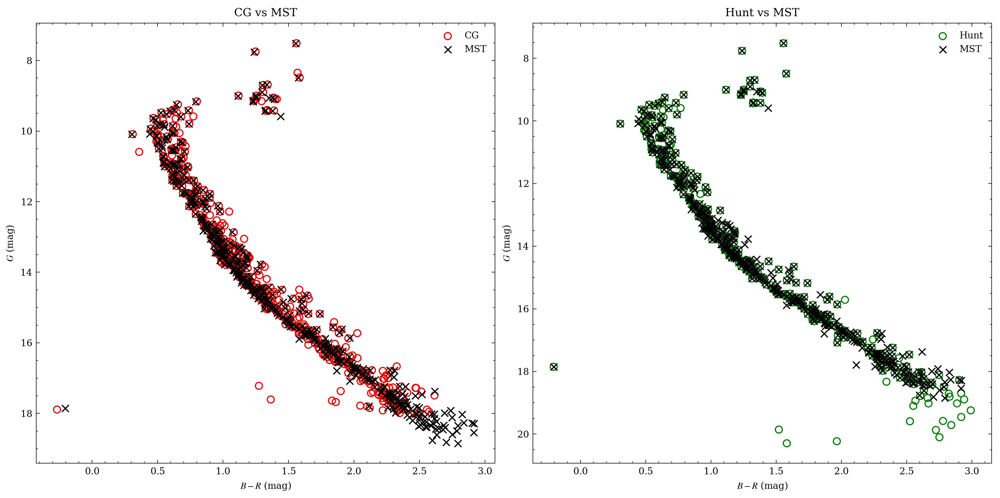

In [71]:
gmm_pred=num_cluster

with plt.style.context(['science', 'ieee', 'no-latex']):

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6),dpi=300)
    print(f"CG members = {len(df_IC_4756_CG)}\n \
    Hunt members = {len(df_hunt_50)}\n \
    MST members = {len(df_IC_4756_cluster[df_IC_4756_cluster['cluster_pred_num']==gmm_pred])}")
    # First scatter plot
    ax1.scatter(df_IC_4756_CG['BP-RP'], df_IC_4756_CG['Gmag'],label='CG', 
                marker="o",edgecolor="red",facecolor="none",lw=1)
    ax1.scatter(df_IC_4756_cluster[df_IC_4756_cluster['cluster_pred_num']==gmm_pred]['bp_rp'], 
                df_IC_4756_cluster[df_IC_4756_cluster['cluster_pred_num']==gmm_pred]['phot_g_mean_mag'], 
                label='MST', c='k',alpha=1, marker='x')
    ax1.set_title("CG vs MST")
    ax1.set_xlabel(r'$B-R$ (mag)')
    ax1.set_ylabel(r'$G$ (mag)')
    ax1.invert_yaxis()  # Reverse the y-axis
    ax1.legend()
    # Second scatter plot
    ax2.scatter(df_hunt_50['BPmag']-df_hunt_50['RPmag'], df_hunt_50['Gmag'], label='Hunt', marker="o",edgecolor="green",facecolor="none",lw=1)
    ax2.scatter(df_IC_4756_cluster[df_IC_4756_cluster['cluster_pred_num']==gmm_pred]['bp_rp'], df_IC_4756_cluster[df_IC_4756_cluster['cluster_pred_num']==gmm_pred]['phot_g_mean_mag'], 
                label='MST', c='k',alpha=1, marker='x')

    ax2.set_title("Hunt vs MST")
    ax2.set_xlabel(r'$B-R$ (mag)')
    ax2.set_ylabel(r'$G$ (mag)')
    ax2.invert_yaxis()  # Reverse the y-axis
    ax2.legend()
    # Adjust layout and display the plot
    plt.tight_layout()
    plt.savefig(path+"/IC_4756_compare.pdf")
    plt.savefig(path+"/IC_4756_compare.jpg")

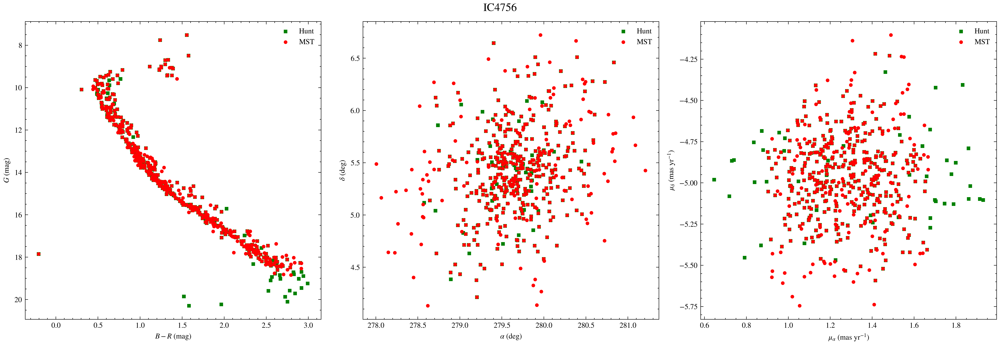

In [72]:
with plt.style.context(['science', 'ieee', 'no-latex']):

    # Create a figure with 1 row and 3 columns
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # First subplot: bp_rp vs phot_g_mean_mag
    sns.scatterplot(data=df_hunt_50, x=df_hunt_50['BPmag']-df_hunt_50['RPmag'], marker='s',
                    y='Gmag', s=15, alpha=1,  
                    color="green", label="Hunt", ax=axes[0], lw=0, edgecolor="none")
    sns.scatterplot(data=df_IC_4756_cluster[df_IC_4756_cluster['cluster_pred_num'] == num_cluster],
                    x='bp_rp', y='phot_g_mean_mag', s=15, alpha=1, color='red', label="MST", ax=axes[0], lw=0, edgecolor="none")
    axes[0].invert_yaxis()
    axes[0].legend()
    axes[0].set_ylabel(r'$G$ (mag)')
    axes[0].set_xlabel(r'$B-R$ (mag)')

    # Second subplot: ra vs dec
    sns.scatterplot(data=df_hunt_50, x='RA_ICRS', y='DE_ICRS', s=15, alpha=1, color="green", marker='s',
                    label="Hunt", ax=axes[1], lw=0, edgecolor="none")
    sns.scatterplot(data=df_IC_4756_cluster[df_IC_4756_cluster['cluster_pred_num'] == num_cluster],
                    x='ra', y='dec', s=15, alpha=1, color='red', label="MST", ax=axes[1], lw=0, edgecolor="none")
    axes[1].legend()
    axes[1].set_ylabel(r'$\delta$ (deg)')
    axes[1].set_xlabel(r'$\alpha$ (deg)')

    # Third subplot: pmra vs pmdec
    sns.scatterplot(data=df_hunt_50, marker='s',
                    x='pmRA', y='pmDE', s=15, alpha=1, color="green", 
                    label="Hunt", ax=axes[2], lw=0, edgecolor="none")
    sns.scatterplot(data=df_IC_4756_cluster[df_IC_4756_cluster['cluster_pred_num'] == num_cluster],
                    x='pmra', y='pmdec', s=15, alpha=1, color='red', label="MST", ax=axes[2], lw=0, edgecolor="none")

    axes[2].legend()
    axes[2].set_ylabel(r'$\mu_\delta$ (mas yr$^{-1}$)')
    axes[2].set_xlabel(r'$\mu_\alpha$ (mas yr$^{-1}$)')

    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.suptitle("IC4756", y=1.03, fontsize=12)
    plt.savefig(path+"/IC_4756_MST_Hunt.pdf")
    plt.savefig(path+"/IC_4756_MST_Hunt.jpg")
    plt.show()

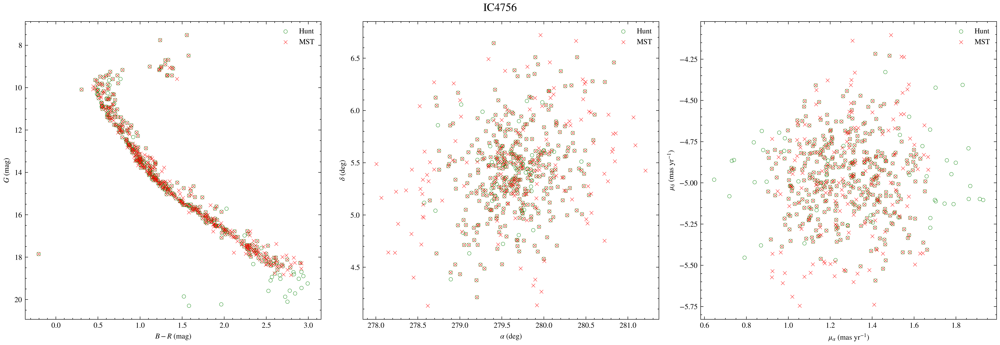

In [73]:
with plt.style.context(['science', 'ieee', 'no-latex']):
    # Create a figure with 1 row and 3 columns
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # First subplot: bp_rp vs phot_g_mean_mag
    sns.scatterplot(data=df_hunt_50, x=df_hunt_50['BPmag']-df_hunt_50['RPmag'],  marker='o',
                    y='Gmag', s=15, alpha=1,  
                    color="green", label="Hunt", ax=axes[0], lw=1, edgecolor="green", facecolors='none')
    sns.scatterplot(data=df_IC_4756_cluster[df_IC_4756_cluster['cluster_pred_num'] == num_cluster],
                    x='bp_rp', y='phot_g_mean_mag', s=15, alpha=1, color='red', label="MST", ax=axes[0], marker='x', lw=1, edgecolor="red")
    axes[0].invert_yaxis()
    axes[0].legend()
    axes[0].set_ylabel(r'$G$ (mag)')
    axes[0].set_xlabel(r'$B-R$ (mag)')

    # Second subplot: ra vs dec
    sns.scatterplot(data=df_hunt_50, x='RA_ICRS', y='DE_ICRS', s=15, alpha=1, color="green", marker='o',
                    label="Hunt", ax=axes[1], lw=1, edgecolor="green", facecolors='none')
    sns.scatterplot(data=df_IC_4756_cluster[df_IC_4756_cluster['cluster_pred_num'] == num_cluster],
                    x='ra', y='dec', s=15, alpha=1, color='red', label="MST", ax=axes[1], marker='x', lw=1, edgecolor="red")
    axes[1].legend()
    axes[1].set_ylabel(r'$\delta$ (deg)')
    axes[1].set_xlabel(r'$\alpha$ (deg)')

    # Third subplot: pmra vs pmdec
    sns.scatterplot(data=df_hunt_50, marker='o',
                    x='pmRA', y='pmDE', s=15, alpha=1, color="green", 
                    label="Hunt", ax=axes[2], lw=1, edgecolor="green", facecolors='none')
    sns.scatterplot(data=df_IC_4756_cluster[df_IC_4756_cluster['cluster_pred_num'] == num_cluster], marker='x',
                    x='pmra', y='pmdec', s=15, alpha=1, color='red', label="MST", ax=axes[2], lw=1, edgecolor="red")
    axes[2].legend()
    axes[2].set_ylabel(r'$\mu_\delta$ (mas yr$^{-1}$)')
    axes[2].set_xlabel(r'$\mu_\alpha$ (mas yr$^{-1}$)')

    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.suptitle("IC4756", y=1.03, fontsize=12)
    plt.savefig(path+"/IC_4756_MST_Hunt_new.pdf")
    plt.savefig(path+"/IC_4756_MST_Hunt_new.jpg")
    plt.show()

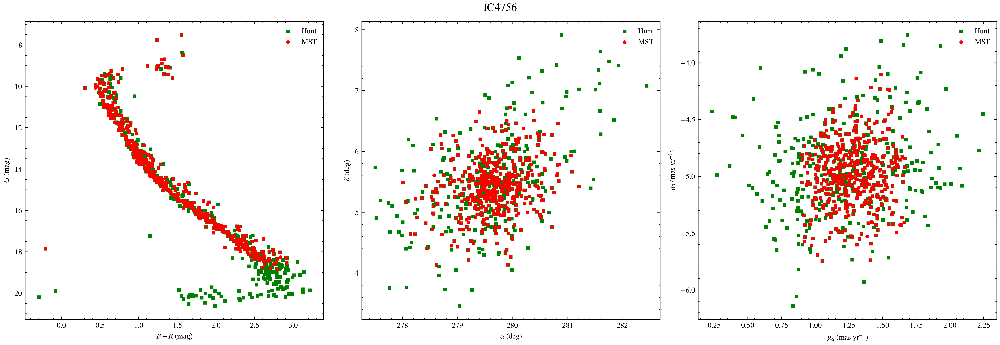

In [74]:
with plt.style.context(['science', 'ieee', 'no-latex']):

    # Create a figure with 1 row and 3 columns
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # First subplot: bp_rp vs phot_g_mean_mag
    sns.scatterplot(data=df_IC_4756_Hunt, x=df_IC_4756_Hunt['BPmag']-df_IC_4756_Hunt['RPmag'], marker='s',
                    y='Gmag', s=15, alpha=1,  
                    color="green", label="Hunt", ax=axes[0], lw=0, edgecolor="none")
    sns.scatterplot(data=df_IC_4756_cluster[df_IC_4756_cluster['cluster_pred_num'] == num_cluster],
                    x='bp_rp', y='phot_g_mean_mag', s=15, alpha=1, color='red', label="MST", ax=axes[0], lw=0, edgecolor="none")
    axes[0].invert_yaxis()
    axes[0].legend()
    axes[0].set_ylabel(r'$G$ (mag)')
    axes[0].set_xlabel(r'$B-R$ (mag)')

    # Second subplot: ra vs dec
    sns.scatterplot(data=df_IC_4756_Hunt, x='RA_ICRS', y='DE_ICRS', s=15, alpha=1, color="green", marker='s',
                    label="Hunt", ax=axes[1], lw=0, edgecolor="none")
    sns.scatterplot(data=df_IC_4756_cluster[df_IC_4756_cluster['cluster_pred_num'] == num_cluster],
                    x='ra', y='dec', s=15, alpha=1, color='red', label="MST", ax=axes[1], lw=0, edgecolor="none")
    axes[1].legend()
    axes[1].set_ylabel(r'$\delta$ (deg)')
    axes[1].set_xlabel(r'$\alpha$ (deg)')

    # Third subplot: pmra vs pmdec
    sns.scatterplot(data=df_IC_4756_Hunt, marker='s',
                    x='pmRA', y='pmDE', s=15, alpha=1, color="green", 
                    label="Hunt", ax=axes[2], lw=0, edgecolor="none")
    sns.scatterplot(data=df_IC_4756_cluster[df_IC_4756_cluster['cluster_pred_num'] == num_cluster],
                    x='pmra', y='pmdec', s=15, alpha=1, color='red', label="MST", ax=axes[2], lw=0, edgecolor="none")

    axes[2].legend()
    axes[2].set_ylabel(r'$\mu_\delta$ (mas yr$^{-1}$)')
    axes[2].set_xlabel(r'$\mu_\alpha$ (mas yr$^{-1}$)')

    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.suptitle("IC4756", y=1.03, fontsize=12)
    plt.savefig(path+"/IC_4756_MST_Hunt_2.pdf")
    plt.savefig(path+"/IC_4756_MST_Hunt_2.jpg")
    plt.show()